In [90]:
import numpy
import numpy as np
import pandas as pd
import sys, glob
import urllib3
import h5py
import cdsapi, zipfile, os, time
import warnings
import shutil
import xarray
from datetime import date
warnings.filterwarnings('ignore')
import pycountry
sys.path.append(os.getcwd()+'/../../cds-backend/code/')
import cds_eua3 as eua
# import numbaprocess
import copy
import glob
from numba import njit
import pandas
import glob
import pickle
import matplotlib
import matplotlib.pyplot as plt
import h5py as h5

def request(rqdict, source, cds='_test', remove_file=True):
    """
    Remember to UPDATE the file .cdsapirc on the server home directory with the CORRECT cds address!
    See e.g. https://cds-test.copernicus-climate.eu/cdsapp#!/dataset/insitu-observations-igra-baseline-network?tab=form 
    """
    if cds != '_test':
        cds = ''
    t0 = time.time()

    c = cdsapi.Client()
    print(c)
    r = c.retrieve(
        source, rqdict)
    print('Request took: ' + str(time.time() - t0) + ' seconds')
    if True:
        r.download(target='download.zip')
        assert os.stat('download.zip').st_size == r.content_length, "Downloaded file is incomplete"
    z = zipfile.ZipFile('download.zip')
    z.extractall(path='./download' + cds + '/' )
    z.close()
    return

igra = 'insitu-observations-igra-baseline-network'

# Fill the request form 
"""
out = request({
    'source': 'IGRA_H',# 'IGRA'
    'variable':['air_temperature'],
    'period':'2009-01-01/2010-12-31',
#     'format': 'csv-lev.zip', # no format = .nc
    'station_name':'AUM00011035',
},igra, remove_file=False)
"""

# load data for a list of stations (IGRA, RHARM)
stations = ['USM00070316' , 'USM00070350', 'USM00070308', 'PSM00091408']

### TO DO
# Here: select the name of the download directory according  to TEST or PUB
# You must change the API file .cdsapi accordingly before the download !!!

cds  = '_test'
cds = ''
out_dir =  'download' + cds



### Download IGRA-RHARM data from CDS / CDSTEST

In [94]:
# container dictionaries for all the downloaded data in the form of pandas dataframe
all_HARM_df = {} 
all_IGRA_df = {}

all_HARM_df_test = {}
all_IGRA_df_test = {}

stdplevs = [ i*100 for i in [10.0, 20.0, 30.0, 50.0, 70.0, 100.0, 150.0, 200.0, 250.0, 300.0, 400.0, 500.0, 700.0, 850.0, 925.0, 1000.0] ]

# Download both public CDS and TEST RHARM
# Loop over the station list, and download data from IGRA and RHARM as csv file.
for cds in ['_test' , '']: 
    # copy correct cdsapirc file 
    if 'test' in cds:
        os.system ( 'cp /users/staff/federico/cdsapirc_TEST.txt  /users/staff/federico/.cdsapirc' )
    else:
        os.system ('cp /users/staff/federico/cdsapirc_PUB.txt  /users/staff/federico/.cdsapirc' )

    out_dir =  'download' + cds

    for s in stations:
        out = request({
        'source': 'IGRA_H',# 'IGRA'
        'variable':['air_temperature'],
        'period':'2009-01-01/2010-12-31',
        'format': 'csv-lev.zip',
        'station_name': s,
        'archive_type': 'harmonized_global_radiosonde_archive',

        },igra, cds=cds, remove_file=False)


        files = glob.glob(out_dir+'/*.csv')


        file_dest = out_dir + '/' + s + '_RHARM_data.csv'
        for f in files:
            if '.csv' in f and 'data' not in f and '_IGRA' not in f :
                os.rename( f, file_dest )

        # reading the data as pandas dataframe
        df = pd.read_csv(file_dest, skiprows=14)
        # storing only standard pressure levels
        df = df[df.air_pressure.isin(stdplevs ) ]
        df =df.sort_values(by=['report_timestamp'])
        # da = eua.CDMDataset('download/USM00070308_IGRA_data.nc').to_dataframe() ### example
        all_HARM_df[s] = df 

        if 'test' in cds:
            all_HARM_df_test[s] = df 

        else:
            all_HARM_df[s] = df 
            
        out = request({
        'source': 'IGRA',# 'IGRA'
        'variable':['air_temperature'],
        'period':'2009-01-01/2010-12-31',
        'format': 'csv-lev.zip',
        'station_name': s,
        'archive_type': 'global_radiosonde_archive',

        },igra, cds=cds, remove_file=False)

        filess = glob.glob(out_dir+'/*.csv')
        file_des = out_dir + '/' + s + '_IGRA_data.csv'
        for ff in filess:
            if '.csv' in f and 'data' not in f and 'HARM' not in f :
                os.rename( ff, file_des )

        dd = pd.read_csv(file_des, skiprows=14)
        dd = dd[dd.air_pressure.isin(stdplevs ) ] 
        dd = dd.sort_values(by=['report_timestamp'])

        if 'test' in cds:
            all_IGRA_df_test[s] = dd 

        else:
            all_IGRA_df[s] = dd             
            

2022-08-26 14:23:30,062 INFO Welcome to the CDS
2022-08-26 14:23:30,064 INFO Sending request to https://cds-test.copernicus-climate.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:30,484 INFO Request is completed
2022-08-26 14:23:30,486 INFO Downloading https://cds-test-download-0000.copernicus-climate.eu/cache-compute-0000/cache/data0/adaptor.insitu_reference.retrieve-1661431358.1197271-6977-2-a788e0bd-7376-4d68-8aa3-bc0a1d15b7d7.zip to download.zip (733.7K)


Request took: 0.7235064506530762 seconds


2022-08-26 14:23:30,823 INFO Download rate 2.1M/s 
2022-08-26 14:23:31,174 INFO Welcome to the CDS
2022-08-26 14:23:31,176 INFO Sending request to https://cds-test.copernicus-climate.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:31,223 INFO Request is completed
2022-08-26 14:23:31,224 INFO Downloading https://cds-test-download-0000.copernicus-climate.eu/cache-compute-0000/cache/data0/adaptor.insitu_reference.retrieve-1661431366.4399023-7015-2-8ac464d0-b840-42d4-985d-ba619260bcfd.zip to download.zip (795.7K)


Request took: 0.07424306869506836 seconds


2022-08-26 14:23:31,303 INFO Download rate 10M/s
2022-08-26 14:23:31,658 INFO Welcome to the CDS
2022-08-26 14:23:31,659 INFO Sending request to https://cds-test.copernicus-climate.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:31,706 INFO Request is completed
2022-08-26 14:23:31,708 INFO Downloading https://cds-test-download-0000.copernicus-climate.eu/cache-compute-0000/cache/data0/adaptor.insitu_reference.retrieve-1661431372.1380026-6987-2-bd80168d-8547-457e-93a5-812c8e041064.zip to download.zip (713.5K)


Request took: 0.07357192039489746 seconds


2022-08-26 14:23:31,764 INFO Download rate 12.6M/s
2022-08-26 14:23:32,043 INFO Welcome to the CDS
2022-08-26 14:23:32,044 INFO Sending request to https://cds-test.copernicus-climate.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:32,088 INFO Request is completed
2022-08-26 14:23:32,089 INFO Downloading https://cds-test-download-0000.copernicus-climate.eu/cache-compute-0000/cache/data1/adaptor.insitu_reference.retrieve-1661431379.873875-7007-3-072f73d4-0c35-41ea-a314-fe38468409b3.zip to download.zip (787.4K)


Request took: 0.07019448280334473 seconds


2022-08-26 14:23:32,144 INFO Download rate 14.4M/s
2022-08-26 14:23:32,422 INFO Welcome to the CDS
2022-08-26 14:23:32,423 INFO Sending request to https://cds-test.copernicus-climate.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:32,472 INFO Request is completed
2022-08-26 14:23:32,474 INFO Downloading https://cds-test-download-0000.copernicus-climate.eu/cache-compute-0000/cache/data1/adaptor.insitu_reference.retrieve-1661431386.2761364-6997-3-731db29b-0851-4b0c-8428-98c4e1db4764.zip to download.zip (681.9K)


Request took: 0.07553362846374512 seconds


2022-08-26 14:23:32,525 INFO Download rate 13.3M/s
2022-08-26 14:23:32,760 INFO Welcome to the CDS
2022-08-26 14:23:32,761 INFO Sending request to https://cds-test.copernicus-climate.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:32,806 INFO Request is completed
2022-08-26 14:23:32,807 INFO Downloading https://cds-test-download-0000.copernicus-climate.eu/cache-compute-0000/cache/data0/adaptor.insitu_reference.retrieve-1661431394.241112-7016-1-da7fa1c8-49c7-4365-bdb4-4b47a214dbc7.zip to download.zip (728.3K)


Request took: 0.07098984718322754 seconds


2022-08-26 14:23:32,858 INFO Download rate 14.3M/s
2022-08-26 14:23:33,102 INFO Welcome to the CDS
2022-08-26 14:23:33,103 INFO Sending request to https://cds-test.copernicus-climate.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:33,149 INFO Request is completed
2022-08-26 14:23:33,150 INFO Downloading https://cds-test-download-0000.copernicus-climate.eu/cache-compute-0000/cache/data0/adaptor.insitu_reference.retrieve-1661431400.5562246-6952-1-22d787a7-dfb0-46c0-8dfb-7441deee1e00.zip to download.zip (827.2K)


Request took: 0.07218289375305176 seconds


2022-08-26 14:23:33,203 INFO Download rate 15.5M/s
2022-08-26 14:23:33,459 INFO Welcome to the CDS
2022-08-26 14:23:33,460 INFO Sending request to https://cds-test.copernicus-climate.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:33,504 INFO Request is completed
2022-08-26 14:23:33,506 INFO Downloading https://cds-test-download-0000.copernicus-climate.eu/cache-compute-0000/cache/data0/adaptor.insitu_reference.retrieve-1661431408.235078-7026-1-b7f42bb6-751e-4d6f-a301-e2b92fcfa12f.zip to download.zip (1000.9K)


Request took: 0.07057356834411621 seconds


2022-08-26 14:23:33,562 INFO Download rate 17.8M/s
2022-08-26 14:23:34,015 INFO Welcome to the CDS
2022-08-26 14:23:34,017 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/insitu-observations-igra-baseline-network


2022-08-26 14:23:34,186 INFO Request is completed
2022-08-26 14:23:34,188 INFO Downloading https://download-0008-clone.copernicus-climate.eu/cache-compute-0008/cache/data6/adaptor.insitu_reference.retrieve-1661505516.6316736-15754-19-a56815db-8608-4dd3-9c38-271b3bca8477.zip to download.zip (733.9K)


Request took: 0.33241796493530273 seconds


2022-08-26 14:23:34,523 INFO Download rate 2.1M/s 
2022-08-26 14:23:34,931 INFO Welcome to the CDS
2022-08-26 14:23:34,932 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:35,069 INFO Request is completed
2022-08-26 14:23:35,070 INFO Downloading https://download-0017.copernicus-climate.eu/cache-compute-0017/cache/data7/adaptor.insitu_reference.retrieve-1661505524.554535-3464-6-d1b68ee3-f671-40e6-a70d-a18c66d80596.zip to download.zip (795.8K)


Request took: 0.16304683685302734 seconds


2022-08-26 14:23:35,466 INFO Download rate 2M/s   
2022-08-26 14:23:35,785 INFO Welcome to the CDS
2022-08-26 14:23:35,786 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:35,880 INFO Request is completed
2022-08-26 14:23:35,882 INFO Downloading https://download-0014-clone.copernicus-climate.eu/cache-compute-0014/cache/data7/adaptor.insitu_reference.retrieve-1661505530.8878393-29442-7-775f5185-5040-4fed-8545-20fa14c6c69b.zip to download.zip (714.2K)


Request took: 0.12174057960510254 seconds


2022-08-26 14:23:36,146 INFO Download rate 2.6M/s
2022-08-26 14:23:36,407 INFO Welcome to the CDS
2022-08-26 14:23:36,408 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:36,485 INFO Request is completed
2022-08-26 14:23:36,486 INFO Downloading https://download-0005-clone.copernicus-climate.eu/cache-compute-0005/cache/data2/adaptor.insitu_reference.retrieve-1661505538.5632942-31487-17-47bc31eb-ba12-4d69-b677-9fb33c71463e.zip to download.zip (787.7K)


Request took: 0.10245752334594727 seconds


2022-08-26 14:23:36,910 INFO Download rate 1.8M/s 
2022-08-26 14:23:37,231 INFO Welcome to the CDS
2022-08-26 14:23:37,234 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:37,317 INFO Request is completed
2022-08-26 14:23:37,318 INFO Downloading https://download-0001-clone.copernicus-climate.eu/cache-compute-0001/cache/data7/adaptor.insitu_reference.retrieve-1661505545.377483-29676-16-c57dc045-5be9-4711-915d-d3c91e035cd0.zip to download.zip (682.2K)


Request took: 0.11339116096496582 seconds


2022-08-26 14:23:37,622 INFO Download rate 2.2M/s 
2022-08-26 14:23:37,853 INFO Welcome to the CDS
2022-08-26 14:23:37,854 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:37,947 INFO Request is completed
2022-08-26 14:23:37,949 INFO Downloading https://download-0014-clone.copernicus-climate.eu/cache-compute-0014/cache/data1/adaptor.insitu_reference.retrieve-1661505553.0982385-32252-19-dc57dc76-354f-4200-a19c-8a1adea6685d.zip to download.zip (728.1K)


Request took: 0.11984729766845703 seconds


2022-08-26 14:23:38,087 INFO Download rate 5.2M/s
2022-08-26 14:23:38,325 INFO Welcome to the CDS
2022-08-26 14:23:38,326 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:38,419 INFO Request is completed
2022-08-26 14:23:38,421 INFO Downloading https://download-0005-clone.copernicus-climate.eu/cache-compute-0005/cache/data9/adaptor.insitu_reference.retrieve-1661505559.4673593-704-14-fd509952-913f-43dc-aa14-70ff6c8c558a.zip to download.zip (827.8K)


Request took: 0.12008094787597656 seconds


2022-08-26 14:23:38,668 INFO Download rate 3.3M/s 
2022-08-26 14:23:38,900 INFO Welcome to the CDS
2022-08-26 14:23:38,901 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/insitu-observations-igra-baseline-network
2022-08-26 14:23:39,033 INFO Request is completed
2022-08-26 14:23:39,034 INFO Downloading https://download-0017.copernicus-climate.eu/cache-compute-0017/cache/data9/adaptor.insitu_reference.retrieve-1661505567.1901023-6719-18-769dc0a7-94fa-42fe-8aaa-b1b471c3c2ab.zip to download.zip (1000.4K)


Request took: 0.15769100189208984 seconds


2022-08-26 14:23:39,286 INFO Download rate 3.9M/s  


### Extract CUON data from local database

In [31]:
basedir = '/mnt/users/scratch/leo/scratch/converted_v8'
stations = ['USM00070316' , 'USM00070350', 'USM00070308', 'PSM00091408']

# 0-20000-0-70316_CEUAS_merged_v1.nc
#file = basedir + '/0-20000-0-70316_CEUAS_merged_v1.nc' 

In [32]:
# container for the CUON dataframes
all_CUON = {}

# loop over groups and variables
var = {'observations_table':['z_coordinate' , 'date_time', 'observation_value'], 
       'advanced_homogenisation': ['RAOBCORE_bias_estimate', 'RASE_bias_estimate', 'RICH_bias_estimate', 'RISE_bias_estimate'] }

def extract_CUON(file: str=''):
    
    """ Extract CUON data from local database.
    Only standard plevels are selected. 
    """
    
    f = h5.File(file, 'r')
    
    plev_indices = np.isin( f['observations_table']['z_coordinate'][:], stdplevs ) 
    ind_min, ind_max = f['recordindices']['126'][0], f['recordindices']['126'][-1]

    # placeholder dic
    d = {}
    
    # remove some data before 2009
    year_filter = 109*365*60*60*24 + 1900
    a = np.where( f['observations_table']['date_time'][ind_min:ind_max] > year_filter )[0][0]

    # boolean mask for plevels
    plev_indices = np.isin( f['observations_table']['z_coordinate'][a+ind_min:ind_max], stdplevs )

    for g in var.keys():
        for v in var[g]:
            d[v] = f[g][v][a+ind_min:ind_max][plev_indices] 
        
    
    df = pd.DataFrame.from_dict(d)
    df['date_time']  = pd.to_datetime( df['date_time'][:], unit='s',  origin=pd.Timestamp('1900-01-01') )
    
    df = df.loc [ (df.date_time >= '20090101' ) & (df.date_time <= '20101231')  ]
    return df

In [33]:
for s in stations:
    f = glob.glob(basedir+'/*'+s[-5:]+'*')[0] # get the correct file name in the CUON dataset for the IGRA identifier
    print('Processing::: ' , f )
    df = extract_CUON(f)
    all_CUON[s] = df 

Processing:::  /mnt/users/scratch/leo/scratch/converted_v8/0-20000-0-70316_CEUAS_merged_v1.nc
Processing:::  /mnt/users/scratch/leo/scratch/converted_v8/0-20000-0-70350_CEUAS_merged_v1.nc
Processing:::  /mnt/users/scratch/leo/scratch/converted_v8/0-20000-0-70308_CEUAS_merged_v1.nc
Processing:::  /mnt/users/scratch/leo/scratch/converted_v8/0-20000-0-91408_CEUAS_merged_v1.nc


In [6]:
## Example
#df = pd.read_csv('download/USM00070316_RHARM_data.csv', skiprows=14)
#df = df[df.air_pressure.isin(stdplevs ) ]
#a = all_HARM_df['PSM00091408']## stations = ['USM00070316' , 'USM00070350', 'USM00070308', 'PSM00091408']
#a.head()

![pic](pic.png)

In [34]:
# ['USM00070316' , 'USM00070350', 'USM00070308', 'PSM00091408']
p = 10000

### bug with timestamps https://github.com/matplotlib/matplotlib/issues/18158/  with matplotlib -> use plotly
def get_plevel_data_from_station(station, p, cds='test'):
    
    """ Extract the data from the IGRA, RHARM, CUON dataframes for plotting.
        Adjustments of RHARM must be calculated by subtracting obs data RHARM-IGRA
        """
    
    if 'test' in cds:
        igra = all_IGRA_df_test
        rharm = all_HARM_df_test
    else:
        igra = all_IGRA_df
        rharm = all_HARM_df

        
    i = igra[station]
    igra_p = i[i.air_pressure==p]
    #igra_p = igra_p.reset_index()

    h = rharm[station]
    harm_p = h[h.air_pressure==p]

    c = all_CUON[station]
    cuon_p = c[c.z_coordinate == p]
    
    return igra_p, harm_p, cuon_p 

In [81]:
def get_rharm_adj(i,h):
    """ Extract the RHARM adjustment.
        First join the dataframe along the timestamp-pressure axes, then calculated the difference between 
        the RHAR-IGRA temp. values """
    
    i = i[['report_timestamp', 'air_pressure', 'air_temperature']]
    i['air_temperature_i'] = i['air_temperature']
    
    h = h [['report_timestamp','air_pressure', 'air_temperature']]
    h['air_temperature_h'] = h['air_temperature']


    d = h.merge(i, how='outer')
    d['adj'] = d.air_temperature_h - d.air_temperature_i
    return d

In [101]:
# QUICK TEST
# i,h,adj = get_plevel_data_from_station(station, p)   ### testing
i,h, c = get_plevel_data_from_station('USM00070308', 10000)   ### testing
print('Len HARM: ' , len(h) , ' Len IGRA: ' , len(h) )
d = get_rharm_adj(i,h)

Len HARM:  1392  Len IGRA:  1392


In [98]:
i.head(20)

,station_name,report_timestamp,report_id,longitude,latitude,air_pressure,air_temperature
89166,USM00070308,2009-01-02 00:00:00+00,31243080,-170.2167,57.15,10000.0,216.85
89459,USM00070308,2009-01-02 12:00:00+00,31243101,-170.2167,57.15,10000.0,216.35
89765,USM00070308,2009-01-03 00:00:00+00,31243118,-170.2167,57.15,10000.0,218.65
90082,USM00070308,2009-01-03 12:00:00+00,31243140,-170.2167,57.15,10000.0,218.05
90450,USM00070308,2009-01-04 00:00:00+00,31243168,-170.2167,57.15,10000.0,220.15
90777,USM00070308,2009-01-04 12:00:00+00,31243194,-170.2167,57.15,10000.0,220.15
91088,USM00070308,2009-01-05 00:00:00+00,31243219,-170.2167,57.15,10000.0,220.45
91389,USM00070308,2009-01-05 12:00:00+00,31243242,-170.2167,57.15,10000.0,219.45
92061,USM00070308,2009-01-06 00:00:00+00,31243265,-170.2167,57.15,10000.0,217.85
92573,USM00070308,2009-01-06 12:00:00+00,31243291,-170.2167,57.15,10000.0,217.95


In [99]:
h.head(20)

,station_name,radiosonde_code,sensor_model,report_timestamp,actual_time,report_id,longitude,latitude,height_of_station_above_sea_level,air_pressure,air_temperature
49423,USM00070308,51,VIZ-B2 (United States),2009-01-02 00:00:00+00,2009-01-01 23:05:00+00,11255494,-170.217,57.15,10,10000,216.85
49615,USM00070308,51,VIZ-B2 (United States),2009-01-02 12:00:00+00,2009-01-02 11:02:00+00,11257544,-170.217,57.15,10,10000,216.35
49813,USM00070308,51,VIZ-B2 (United States),2009-01-03 00:00:00+00,2009-01-02 23:02:00+00,11256066,-170.217,57.15,10,10000,218.65
50001,USM00070308,51,VIZ-B2 (United States),2009-01-03 12:00:00+00,2009-01-03 11:03:00+00,11255183,-170.217,57.15,10,10000,218.05
50209,USM00070308,51,VIZ-B2 (United States),2009-01-04 00:00:00+00,2009-01-03 23:11:00+00,11255846,-170.217,57.15,10,10000,220.15
50518,USM00070308,51,VIZ-B2 (United States),2009-01-04 12:00:00+00,2009-01-04 11:03:00+00,11257555,-170.217,57.15,10,10000,220.15
50732,USM00070308,51,VIZ-B2 (United States),2009-01-05 00:00:00+00,2009-01-04 23:04:00+00,11255861,-170.217,57.15,10,10000,220.45
51036,USM00070308,51,VIZ-B2 (United States),2009-01-05 12:00:00+00,2009-01-05 11:03:00+00,11255346,-170.217,57.15,10,10000,219.45
51238,USM00070308,51,VIZ-B2 (United States),2009-01-06 00:00:00+00,2009-01-05 23:01:00+00,11255507,-170.217,57.15,10,10000,217.85
51516,USM00070308,51,VIZ-B2 (United States),2009-01-06 12:00:00+00,2009-01-06 11:02:00+00,11255199,-170.217,57.15,10,10000,217.95


In [100]:
d.head(20)

,report_timestamp,air_pressure,air_temperature,air_temperature_h,air_temperature_i,adj
0,2009-01-02 00:00:00+00,10000,216.85,216.85,216.85,0.0
1,2009-01-02 12:00:00+00,10000,216.35,216.35,216.35,0.0
2,2009-01-03 00:00:00+00,10000,218.65,218.65,218.65,0.0
3,2009-01-03 12:00:00+00,10000,218.05,218.05,218.05,0.0
4,2009-01-04 00:00:00+00,10000,220.15,220.15,220.15,0.0
5,2009-01-04 12:00:00+00,10000,220.15,220.15,220.15,0.0
6,2009-01-05 00:00:00+00,10000,220.45,220.45,220.45,0.0
7,2009-01-05 12:00:00+00,10000,219.45,219.45,219.45,0.0
8,2009-01-06 00:00:00+00,10000,217.85,217.85,217.85,0.0
9,2009-01-06 12:00:00+00,10000,217.95,217.95,217.95,0.0


In [85]:
station, p = 'PSM00091408' , 10000 
i,h, c = get_plevel_data_from_station(station, p)   ### testing


In [87]:
i

,station_name,report_timestamp,report_id,longitude,latitude,air_pressure,air_temperature
123219,PSM00091408,2009-01-02 00:00:00+00,32125084,134.4833,7.3333,10000.0,187.75
123796,PSM00091408,2009-01-02 12:00:00+00,32125107,134.4833,7.3333,10000.0,187.55
124342,PSM00091408,2009-01-03 00:00:00+00,32125124,134.4833,7.3333,10000.0,188.05
124963,PSM00091408,2009-01-03 12:00:00+00,32125140,134.4833,7.3333,10000.0,187.85
125555,PSM00091408,2009-01-04 00:00:00+00,32125162,134.4833,7.3333,10000.0,188.35
...,...,...,...,...,...,...,...
170324,PSM00091408,2010-12-29 00:00:00+00,32118421,134.4833,7.3333,10000.0,189.05
171112,PSM00091408,2010-12-29 12:00:00+00,32118437,134.4833,7.3333,10000.0,188.25
171281,PSM00091408,2010-12-30 00:00:00+00,32118454,134.4833,7.3333,10000.0,188.05
171613,PSM00091408,2010-12-30 12:00:00+00,32118470,134.4833,7.3333,10000.0,188.65


In [88]:
h

,station_name,radiosonde_code,sensor_model,report_timestamp,actual_time,report_id,longitude,latitude,height_of_station_above_sea_level,air_pressure,air_temperature
65665,PSM00091408,52,Vaisala RS80-57H,2009-01-02 00:00:00+00,2009-01-01 23:03:00+00,1959642,134.483,7.3333,30,10000,NaN
65889,PSM00091408,52,Vaisala RS80-57H,2009-01-02 12:00:00+00,2009-01-02 11:03:00+00,1959655,134.483,7.3333,30,10000,NaN
66159,PSM00091408,52,Vaisala RS80-57H,2009-01-03 00:00:00+00,2009-01-03 00:15:00+00,1959674,134.483,7.3333,30,10000,NaN
66393,PSM00091408,52,Vaisala RS80-57H,2009-01-03 12:00:00+00,2009-01-03 11:02:00+00,1959693,134.483,7.3333,30,10000,NaN
66619,PSM00091408,52,Vaisala RS80-57H,2009-01-04 00:00:00+00,2009-01-03 23:01:00+00,1959711,134.483,7.3333,30,10000,NaN
...,...,...,...,...,...,...,...,...,...,...,...
28607,PSM00091408,51,VIZ-B2 (United States),2010-12-29 00:00:00+00,2010-12-28 23:01:00+00,1943712,134.483,7.3333,30,10000,NaN
28956,PSM00091408,51,VIZ-B2 (United States),2010-12-29 12:00:00+00,2010-12-29 11:10:00+00,1943731,134.483,7.3333,30,10000,NaN
29030,PSM00091408,51,VIZ-B2 (United States),2010-12-30 00:00:00+00,2010-12-29 23:00:00+00,1943462,134.483,7.3333,30,10000,NaN
29192,PSM00091408,51,VIZ-B2 (United States),2010-12-30 12:00:00+00,2010-12-30 12:05:00+00,1943751,134.483,7.3333,30,10000,NaN


2022-08-26 14:21:11,772 INFO Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2022-08-26 14:21:11,876 INFO Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


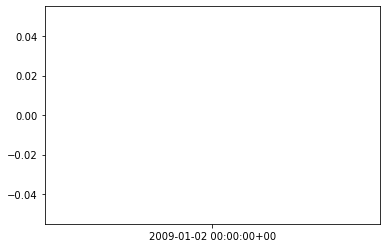

In [91]:
plt.plot(h.report_timestamp, h.air_temperature)

In [ ]:
-> NO data for HARM at p=10000

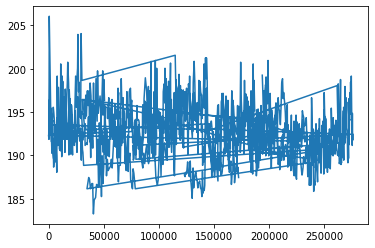

In [93]:
plt.plot(i.air_temperature)

In [68]:
def get_night_day_diff(df, what='IGRA'):
    """ Extract day and night differences from a dataframe.
        Processing slightly different for IGRA/RHARM and CUON """
    
    if what=='IGRA':
        df['hour'] = pd.to_datetime(df.report_timestamp).dt.hour
        iday   = df[  df.hour.isin([6,7,8,9,10,11,12,13,14,15,16,17,18]) ]
        inight = df[ ~df.hour.isin([6,7,8,9,10,11,12,13,14,15,16,17,18]) ] 

        iday  ['date'] = pd.to_datetime(iday  ['report_timestamp']).dt.date
        inight['date'] = pd.to_datetime(inight['report_timestamp']).dt.date

        iday = iday.drop_duplicates(subset=['date'])
        inight = inight.drop_duplicates(subset=['date'])

        iday   =iday  [['date', 'hour' , 'air_temperature', 'air_pressure']]
        inight =inight[['date', 'hour' , 'air_temperature', 'air_pressure']]

        dates = inight [ inight['date'].isin( iday.date) ].date 
        #print('aaa', len(dates) , len (iday[ iday.date.isin(dates)].air_temperature) , len(inight[inight.date.isin(dates)].air_temperature)     )
        temp_diff = np.array(iday[ iday.date.isin(dates)].air_temperature) - np.array(inight[inight.date.isin(dates)].air_temperature)
        
        return dates, temp_diff 
    
    else:
        
        df['hour'] = df.date_time.dt.hour
        iday   = df[  df.hour.isin([6,7,8,9,10,11,12,13,14,15,16,17,18]) ]
        inight = df[ ~df.hour.isin([6,7,8,9,10,11,12,13,14,15,16,17,18]) ] 

        iday  ['date'] = pd.to_datetime(iday  ['date_time']).dt.date
        inight['date'] = pd.to_datetime(inight['date_time']).dt.date

        iday = iday.drop_duplicates(subset=['date'])
        inight = inight.drop_duplicates(subset=['date'])

        iday   =iday  [['date', 'hour' , 'observation_value', 'z_coordinate', 'RAOBCORE_bias_estimate']]
        inight =inight[['date', 'hour' , 'observation_value', 'z_coordinate', 'RAOBCORE_bias_estimate']]

        dates = inight [ inight['date'].isin( iday.date) ].date 

        #print('aaa', len(dates) , len (iday[ iday.date.isin(dates)].air_temperature) , len(inight[inight.date.isin(dates)].air_temperature)     )
        temp_diff = np.array(iday[ iday.date.isin(dates)].observation_value - np.array( inight[inight.date.isin(dates)].observation_value ) )
        
        temp_diff_adj = np.array(iday[ iday.date.isin(dates)].observation_value - iday[ iday.date.isin(dates)].RAOBCORE_bias_estimate )  
        temp_diff_adj = temp_diff_adj - np.array( inight[inight.date.isin(dates)].observation_value -  inight[inight.date.isin(dates)].RAOBCORE_bias_estimate ) 

        return dates, temp_diff, temp_diff_adj

In [9]:
#d,t = get_night_day_diff(h)
#len(d)
#len(t)

In [69]:
def make_timeseries(station, p, what='data'):
    import plotly.graph_objects as go

    from plotly.subplots import make_subplots
    
    
        

    # extracting data for plotting (IGRA, RHARM, CUON)

    i_test,h_test,c = get_plevel_data_from_station(station, p, cds='test') 
    i,h,c = get_plevel_data_from_station(station, p, cds='') 

    
    # calculating day-night temp difference
    i_date, i_tempdiff = get_night_day_diff(i)  # RHARM
    h_date, h_tempdiff = get_night_day_diff(h)  # RHARM
    c_date, c_temp_diff, c_temp_diff_RAOBCORE = get_night_day_diff(c, what='CUON')
    
    #CUON Bias corrections can be selected among  ['RAOBCORE_bias_estimate', 'RASE_bias_estimate', 'RICH_bias_estimate', 'RISE_bias_estimate'] 
    #rharm_adj = h.air_temperature - i.air_temperature
    #rharm_adj_test = h_test.air_temperature - i_test.air_temperature
    
    adj = get_rharm_adj(i,h)
    adj_test = get_rharm_adj( i_test,h_test)
    #print('igra mean::' , np.nanmean(i_tempdiff) , 'harm mean::' , np.nanmean(h_tempdiff) )
    
    if what == 'data':
        fig = go.Figure()

        ### Temperature raw data 
        fig.add_trace(go.Scatter(x= i.report_timestamp, y= i.air_temperature, name= 'IGRA',
                                             line=dict(width=2,color='blue')),
        )
        fig.add_trace(go.Scatter(x=h.report_timestamp, y= h.air_temperature, name= 'HARM',
                                             line=dict(width=2,color='cyan')),
        )
        fig.add_trace(go.Scatter(x= c.date_time, y= c.observation_value, name= 'CUON',
                                             line=dict(width=2,color='lime')),
        )
        
        fig.update_layout(title_text='Temperature Time Series for ' + station + ' at p=' + str(p) + ' [Pa]',
                           xaxis_title='',
                           yaxis_title='Temp [K]',
                           autosize=False,
            width=1500,
            height=800,
                         )
            
            
        
     ### DAY-NIGHT difference
        fig2 = go.Figure()

        fig2.add_trace(go.Scatter(x=h_date, y= h_tempdiff , name= 'HARM Temp 12GMT-00GMT',
                                             line=dict(width=2,color='slateblue')),
        )

        fig2.add_trace(go.Scatter(x=c_date, y= c_temp_diff , name= 'CUON Temp 12GMT-00GMT',
                                             line=dict(width=2,color='red')),
        )      
        
        fig2.add_trace(go.Scatter(x=c_date, y= c_temp_diff_RAOBCORE , name= 'CUON RAOBCORE Adj. Temp 12GMT-00GMT',
                                             line=dict(width=2,color='gold')),
        )   
            
  
        fig2.update_layout(title_text='Temperature Day-Night Series for ' + station + ' at p=' + str(p) + ' [Pa]',
                           xaxis_title='',
                           yaxis_title='Temp [K]',
                           autosize=False,
            width=1500,
            height=800,
                         )
    
    
    else:
        fig = go.Figure()

        ### Adjustment  
        fig.add_trace(go.Scatter(x=adj.report_timestamp, y= adj.adj, name= 'RHARM CDS Adjust.',
                                             line=dict(width=2,color='lime')),
        )
        fig.add_trace(go.Scatter(x=adj_test.report_timestamp, y= adj_test.adj, name= 'RHARM CDS-TEST Adjust.',
                                             line=dict(width=2,color='green')),
        )
        
        for a,col in zip( ['RAOBCORE_bias_estimate', 'RASE_bias_estimate', 'RICH_bias_estimate', 'RISE_bias_estimate'],
                      ['navy','blue','slateblue','cyan'] ):
                fig.add_trace(go.Scatter(x=c.date_time, y= c[a], name= a,
                                             line=dict(width=2,color=col)),
        )

        fig2 = go.Figure()

        fig2.add_trace( go.Histogram(x=rharm_adj, name = 'RHARM Adj.'),
        )
    
        fig.update_layout(title_text='Temperature Adjustments Series for ' + station + ' at p=' + str(p) + ' [Pa]',
                           xaxis_title='',
                           yaxis_title='Temp [K]',
                           autosize=False,
            width=1500,
            height=700,
                         )

        fig2.update_layout(title_text='Adjustments Histogram for ' + station + ' at p=' + str(p) + ' [Pa]',
                           xaxis_title='',
                           yaxis_title='Temp [K]',
                           autosize=False,
            width=1500,
            height=700,
                         )
            
    return fig, fig2

![pic](70308.png)

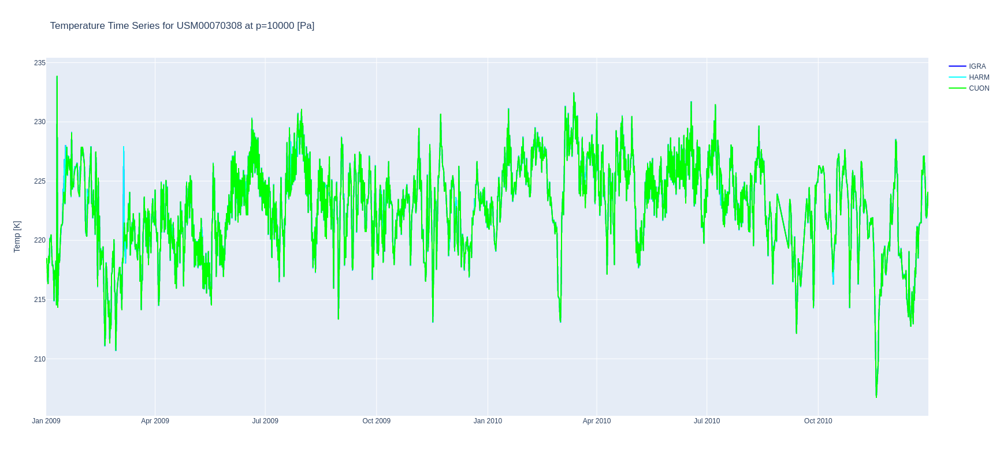

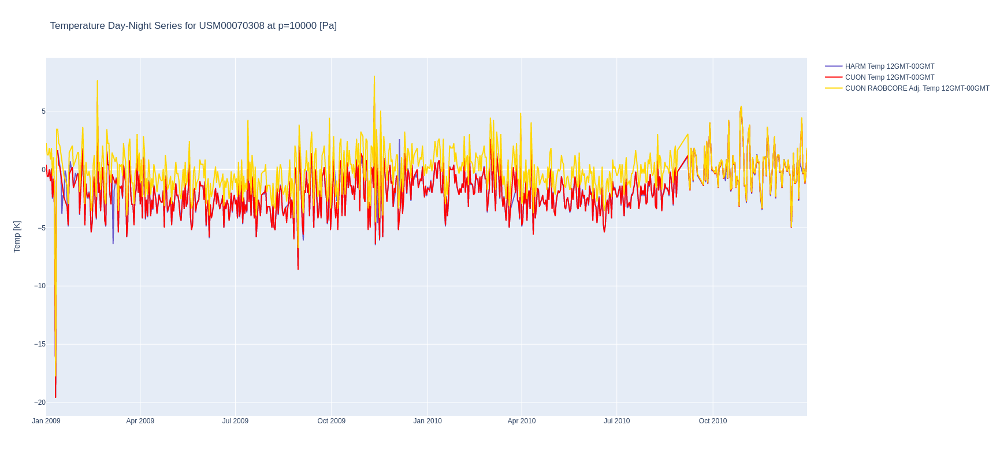

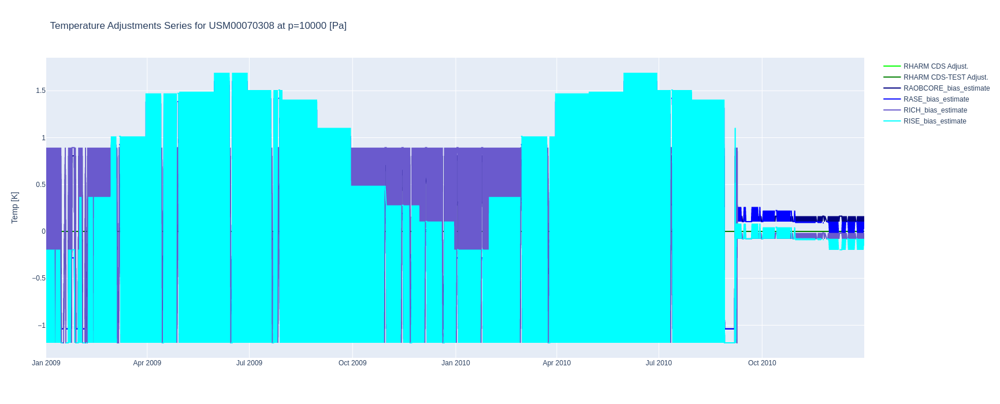

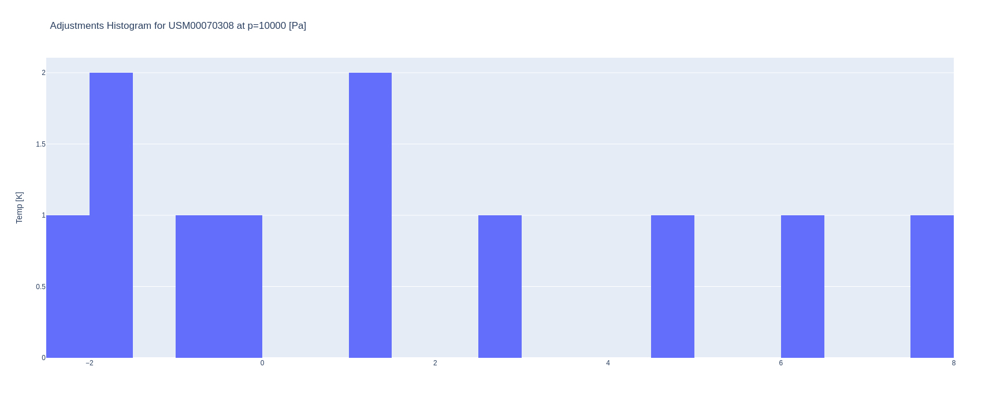

In [72]:
station, p = 'USM00070308' , 10000 
f,g = make_timeseries(station, p)
f.show()
g.show()
f,g = make_timeseries(station, p, what='ad')
f.show()
g.show()

![pic](70316.png)

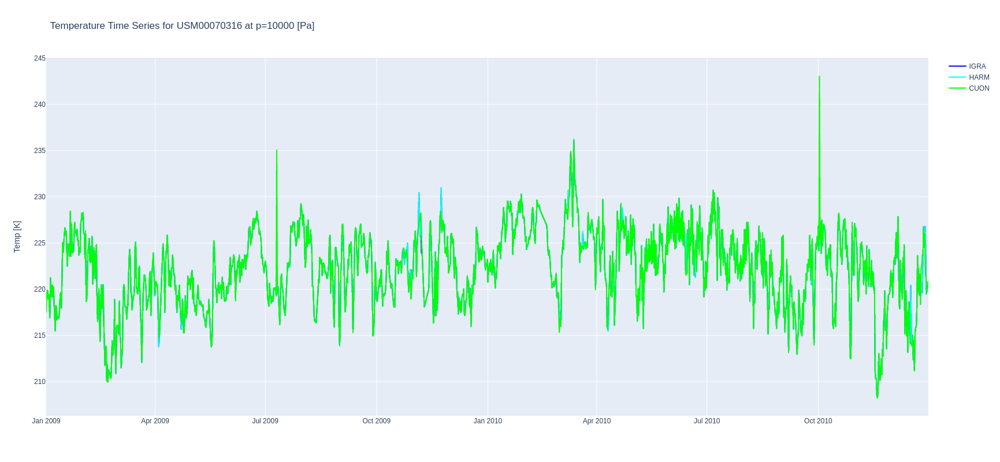

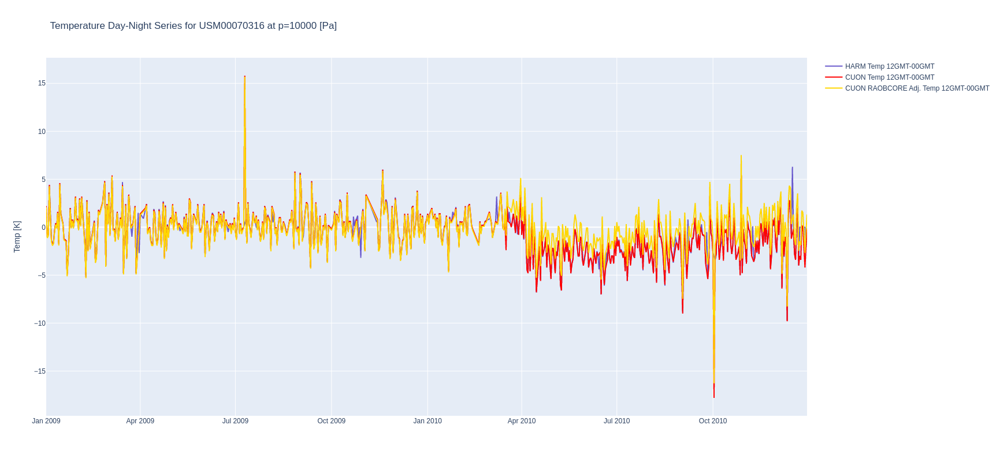

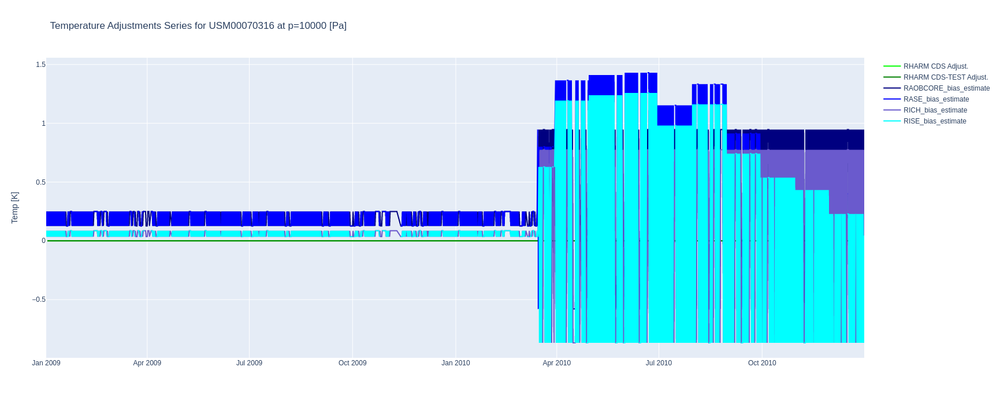

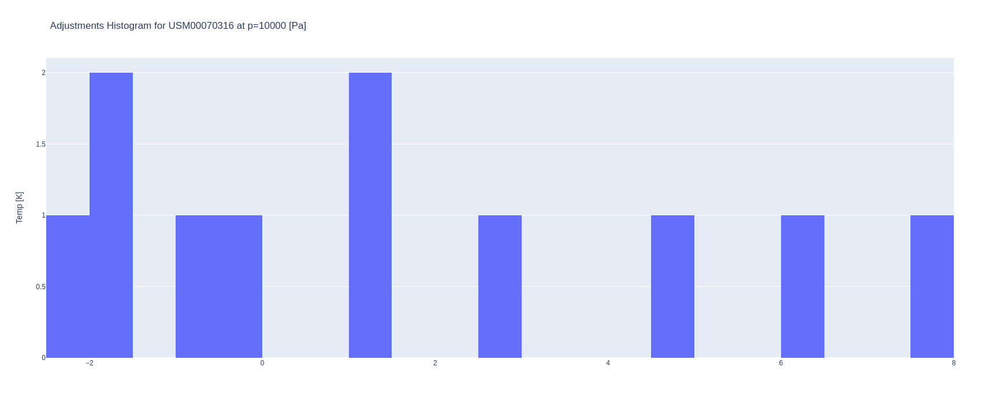

In [75]:
station, p = 'USM00070316' , 10000 
f,g = make_timeseries(station, p)
f.show()
g.show()
f,g = make_timeseries(station, p, what='ad')
f.show()
g.show()

![pic](70350.png)

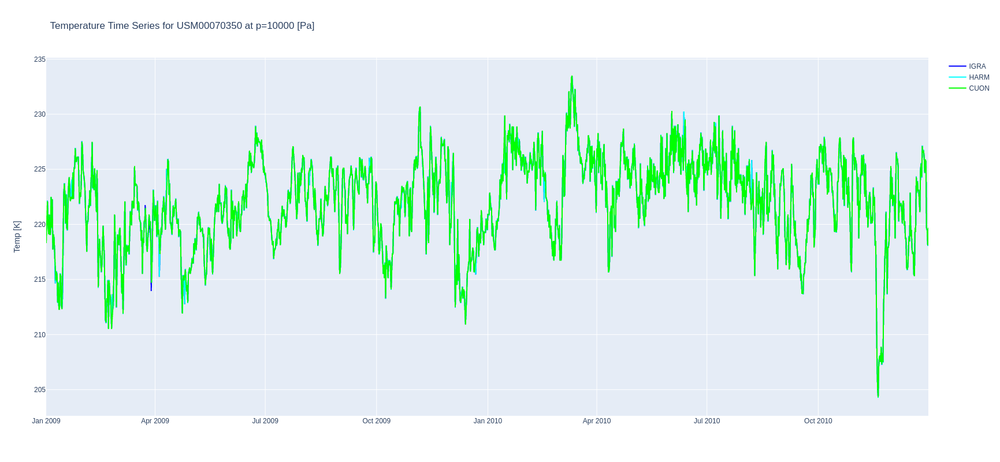

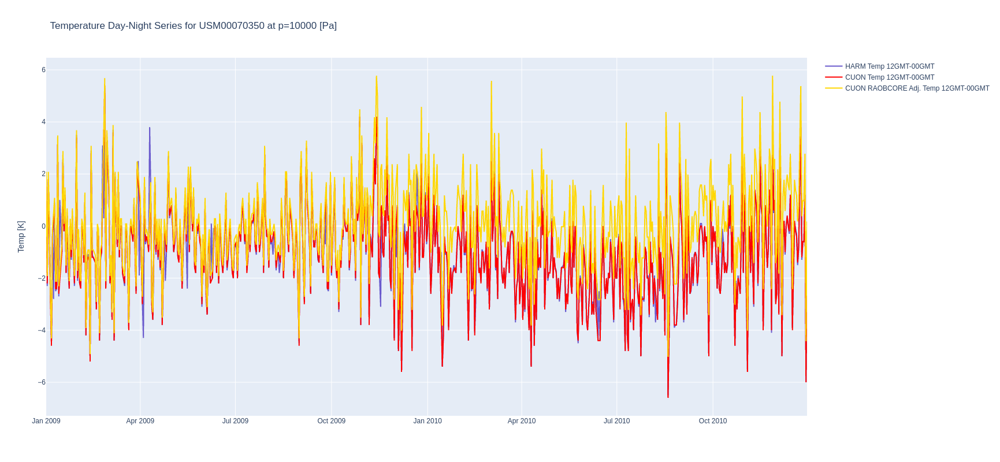

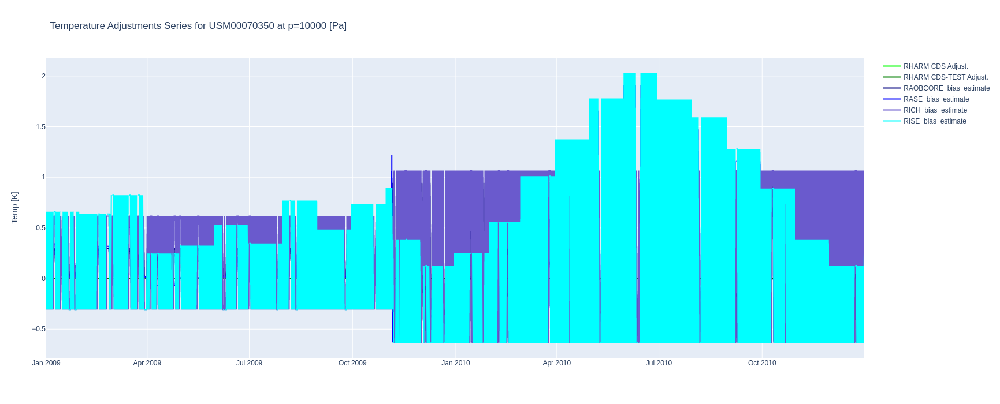

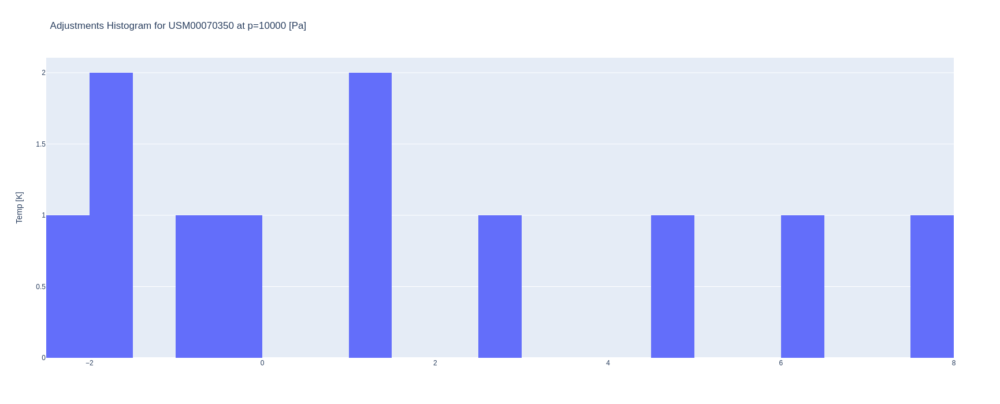

In [76]:
station, p = 'USM00070350' , 10000 
f,g = make_timeseries(station, p)
f.show()
g.show()
f,g = make_timeseries(station, p, what='ad')
f.show()
g.show()

![pic](91408.png)

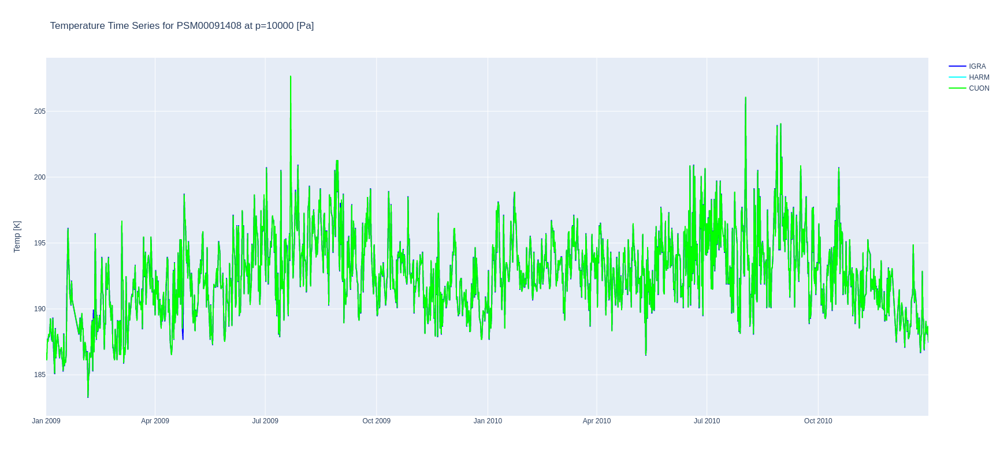

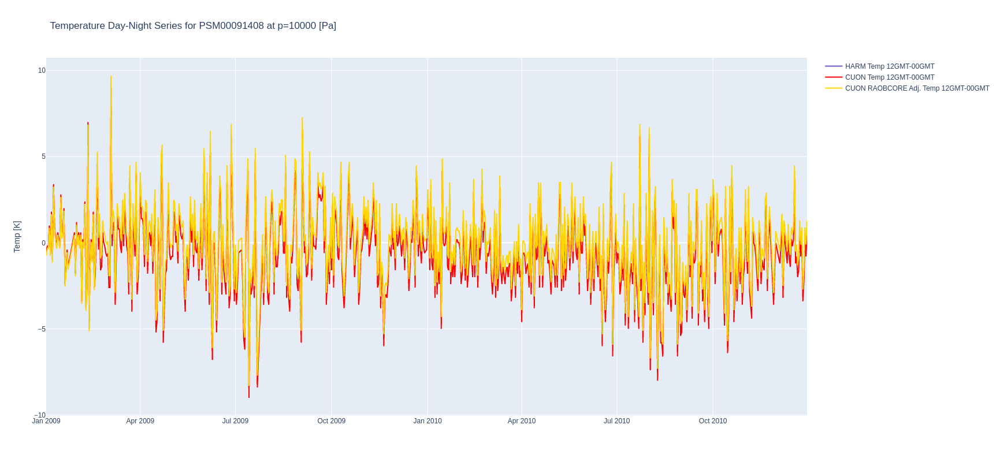

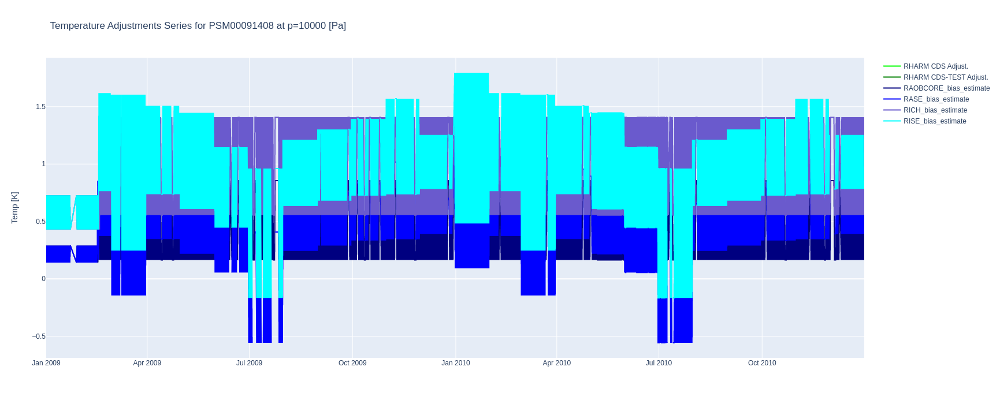

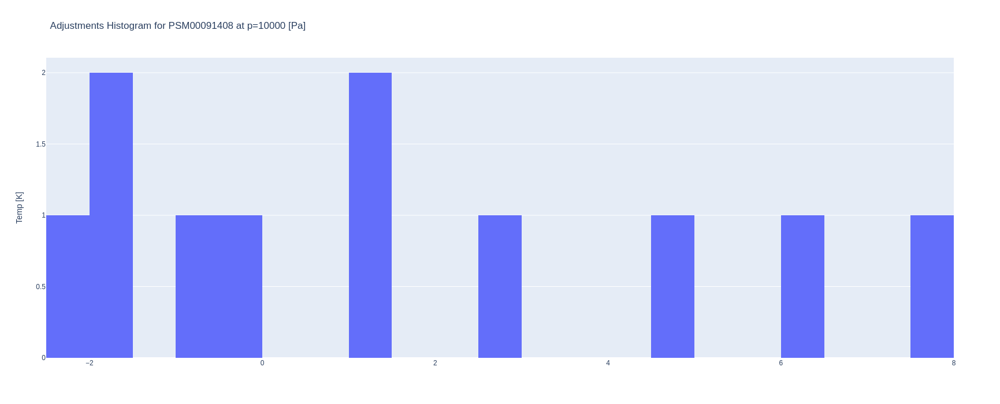

In [84]:
station, p = 'PSM00091408' , 10000 
f,g = make_timeseries(station, p)
f.show()
g.show()
f,g = make_timeseries(station, p, what='ad')
f.show()
g.show()